In [2]:
import numpy as np
import pandas as pd

from tqdm import tqdm
import os

In [3]:
import dask.dataframe as dd

import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_io as tfio

import seaborn as sns
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import librosa
import librosa.display
import glob

import csv
import io

from IPython.display import Audio

In [4]:
ROOT_DIR = '/kaggle/input/birdclef-2023/'
AUDIO_DIR = ROOT_DIR+'train_audio/'
METADATA_DIR = ROOT_DIR+'train_metadata.csv'

In [5]:
mfcc_data = pd.read_csv("/kaggle/input/bird-clef-mfccs/MFCCs_For_Birds.csv")
# mfcc_data = dd.read_csv('/kaggle/input/bird-clef-mfccs/MFCCs_For_Birds.csv')
metadata = pd.read_csv(ROOT_DIR+'train_metadata.csv')

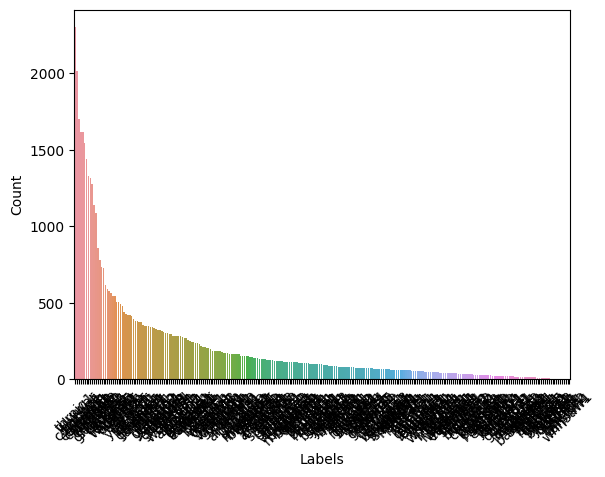

In [6]:
sns.barplot(x=mfcc_data['labels'].value_counts().index, y=mfcc_data['labels'].value_counts())
plt.xlabel('Labels')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

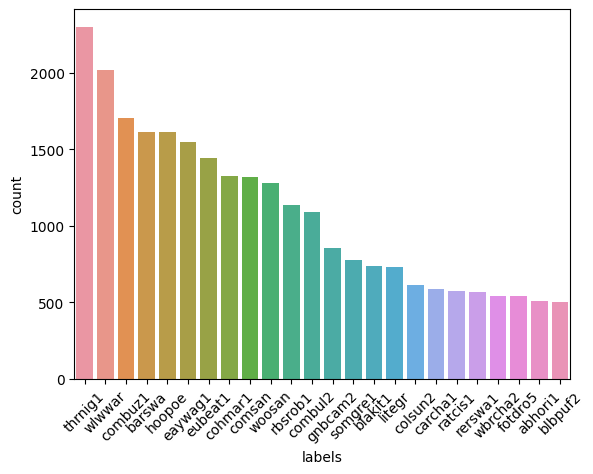

In [7]:
sns.barplot(x=mfcc_data['labels'].value_counts()[mfcc_data['labels'].value_counts()>500].index, 
            y=mfcc_data['labels'].value_counts()[mfcc_data['labels'].value_counts()>500])
plt.xticks(rotation=45)
plt.show()

In [24]:
def load_audio(path):
    # sr=sample_rate
    audio, sr = librosa.load(path)
    #play the audio
    display(Audio(data=audio, rate=sr))
    
    #show the waveform
    plt.figure(figsize=(14, 5))
    librosa.display.waveshow(audio, sr=sr)
    plt.title('Wave Form')
    plt.show()
    
    # Short-time Fourier transform (STFT)
    X = librosa.stft(audio)
    # Convert an amplitude spectrogram to dB-scaled spectrogram
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(14, 5))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz') 
    plt.title('Spectogram')
    plt.colorbar()
    
    spectral_rolloff = librosa.feature.spectral_rolloff(y = audio, sr=sr)[0]
    plt.figure(figsize=(14, 5))
    librosa.display.waveshow(audio, sr=sr, alpha=0.4)
    plt.title("Spectral Rolloff")
    plt.show()

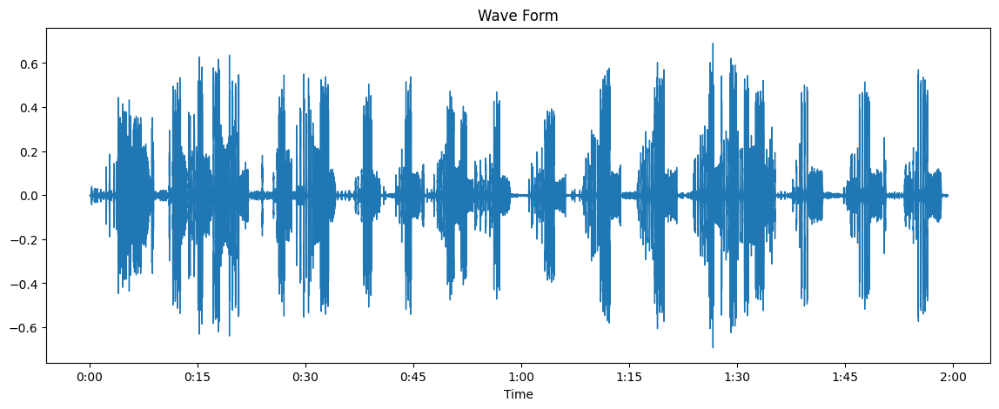

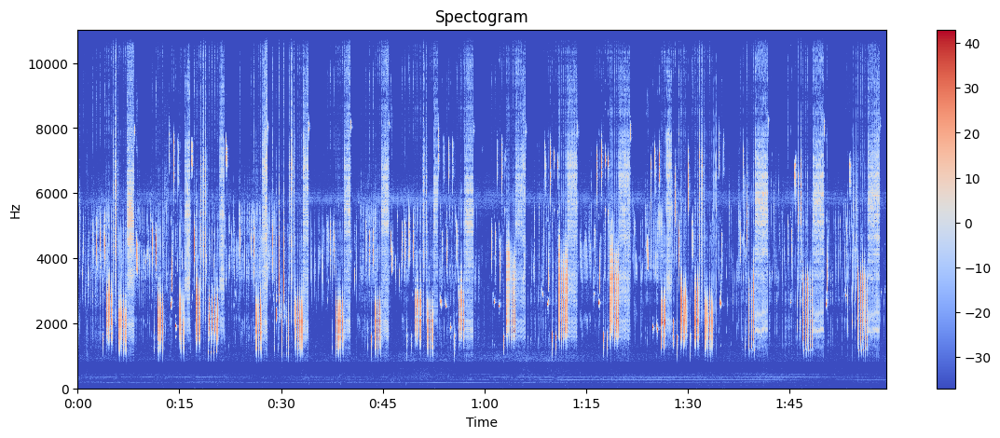

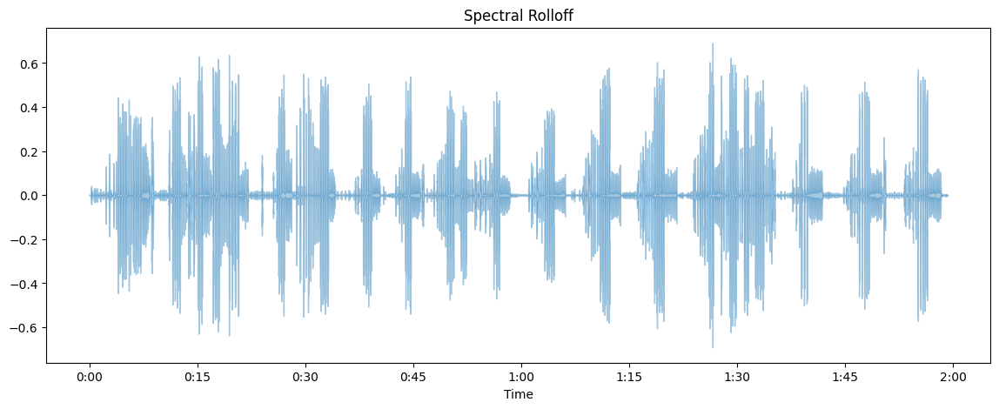

In [25]:
load_audio(AUDIO_DIR + "thrnig1/XC110335.ogg")

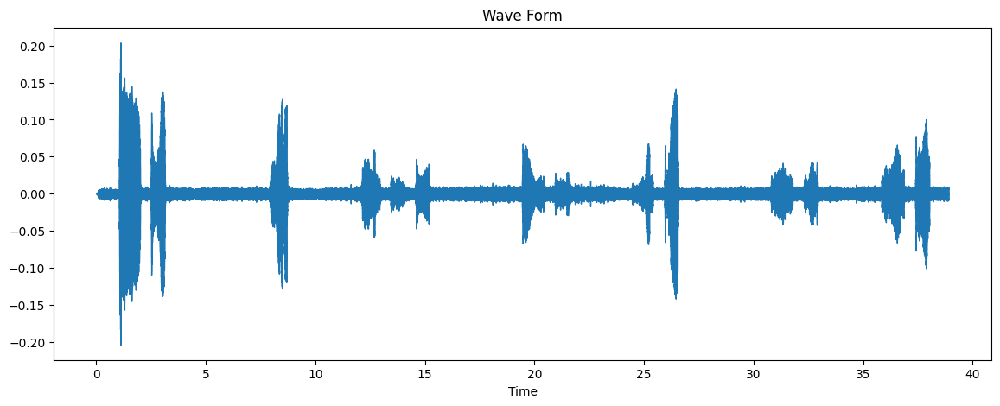

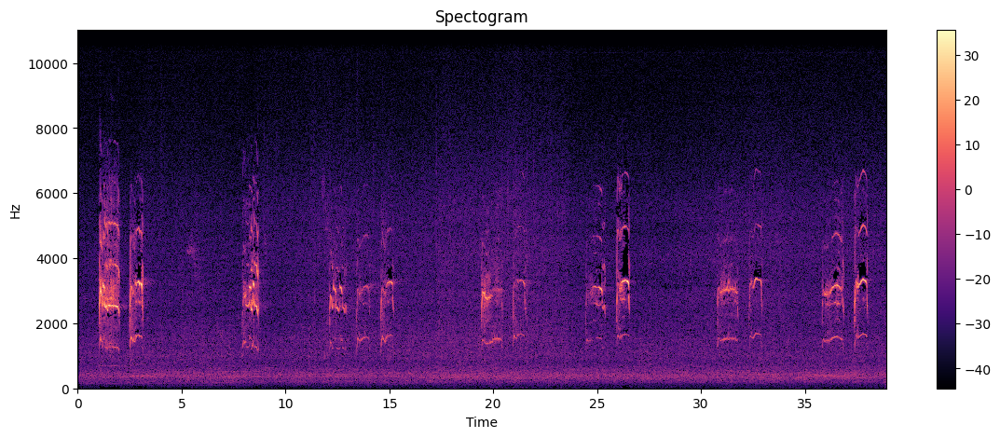

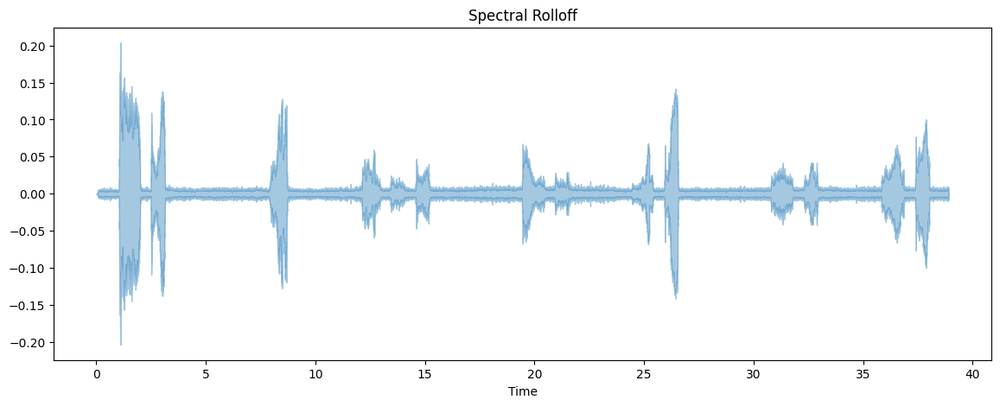

In [26]:
load_audio(AUDIO_DIR + "combuz1/XC112692.ogg")

In [25]:
def data_list(datadir,metadata):
        audio_list = [datadir + x  for x in list(metadata['filename'])]
        labels = [y for y in list(metadata['primary_label'])]
        return audio_list, labels
    
audio_list, labels = data_list(AUDIO_DIR, metadata)

clip_length = []
for item in tqdm(audio_list):
    test_sig, test_sr = librosa.load(item)
    time = librosa.get_duration(y = test_sig,sr = test_sr )
    del test_sig
    clip_length.append(time)

100%|██████████| 16941/16941 [27:29<00:00, 10.27it/s]  

[45.60979591836735, 18.677596371882085, 38.76575963718821, 29.257188208616782, 42.34453514739229, 9.408027210884354, 25.39201814058957, 42.631020408163266, 20.688027210884353, 19.931020408163267, 19.464036281179137, 24.26702947845805, 44.35201814058957, 34.011473922902496, 3.422040816326531, 38.00816326530612, 65.93310657596372, 44.24403628117914, 18.144036281179137, 32.33963718820862, 23.092290249433105, 24.97310657596372, 35.47428571428571, 62.563265306122446, 58.90616780045352, 57.41718820861678, 61.08, 20.140408163265306, 26.17469387755102, 26.43591836734694, 7.157596371882086, 11.572290249433106, 53.65551020408163, 21.48, 50.90403628117914, 62.11201814058957, 38.68734693877551, 27.298004535147392, 37.773106575963716, 15.986938775510204, 36.57147392290249, 22.85718820861678, 34.82122448979592, 14.628571428571428, 14.837596371882086, 26.906167800453513, 45.557596371882084, 32.68802721088436, 74.57963718820862, 45.32244897959184]


/opt/conda/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


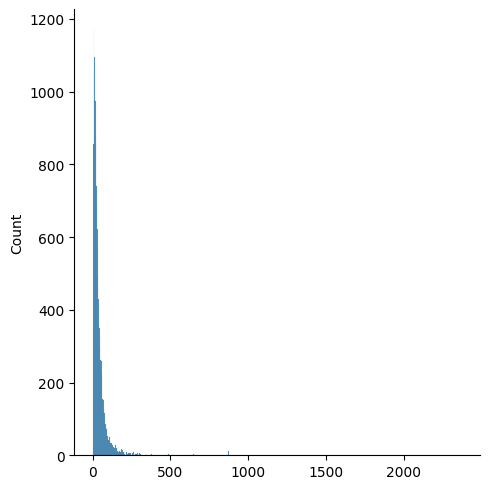

In [26]:
sns.displot(clip_length)